In [1]:
import os
import glob
import pandas as pd
import numpy as np
import csv
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as stats
from scipy.stats import pearsonr, spearmanr

import importlib
import utils
importlib.reload(utils)
from utils import detect_delimiter, detect_header

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

import umap

In [2]:
# Charger le fichier CSV 
factors = pd.read_csv('tables/factors_for_visualization.csv')
factors.head()

/tmp/ipykernel_1037/2601963336.py:2: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  factors = pd.read_csv('tables/factors_for_visualization.csv')


,canton,codgeo,libgeo,acces_medecin_generaliste,acces_soins_infirmiers,nb_seveso,Nb_habitants,nb_creation_entreprises_industrie_23,nb_creation_entreprises_construction_23,nb_creation_entreprises_transport_hebergement_restauration_23,...,nb_emplois,age_0_10,age_11_17,age_18_39,age_40_79,age_80_plus,altitude_moyenne,densite_population,effectif_salaries,impots_moyen
0,108.0,1001,L'Abergement-Clémenciat,1.8,121.5,0.0,832.0,0.0,2.0,0.0,...,75.0,112.0,77.0,171.0,407.0,39.0,242,52.33,19.0,178595.0
1,101.0,1002,L'Abergement-de-Varey,2.0,109.2,0.0,267.0,0.0,0.0,1.0,...,29.0,37.0,34.0,52.0,123.0,16.0,483,29.02,6.0,73140.0
2,101.0,1004,Ambérieu-en-Bugey,2.9,208.5,0.0,14854.0,7.0,17.0,61.0,...,8152.0,1955.0,1212.0,4344.0,6007.0,769.0,379,603.82,4277.0,7597266.0
3,122.0,1005,Ambérieux-en-Dombes,3.9,145.8,0.0,1897.0,1.0,2.0,4.0,...,261.0,257.0,157.0,466.0,826.0,76.0,290,119.31,150.0,537479.0
4,104.0,1006,Ambléon,0.8,47.0,0.0,113.0,1.0,0.0,0.0,...,5.0,10.0,2.0,28.0,67.0,6.0,589,19.15,0.0,32722.0


In [3]:
print(factors.shape)

(35031, 134)


In [4]:
## normaliser chaque colonne
for col in factors.columns:
    print(col)


canton
codgeo
libgeo
acces_medecin_generaliste
acces_soins_infirmiers
nb_seveso
Nb_habitants
nb_creation_entreprises_industrie_23
nb_creation_entreprises_construction_23
nb_creation_entreprises_transport_hebergement_restauration_23
nb_creation_entreprises_information_communication_23
nb_creation_entreprises_finance_asssurance_23
nb_creation_entreprises_immobilier
nb_creation_entreprises_scientifique_technique_admininistratif_23
nb_creation_entreprises_public_sante_enseignement_23
nb_creation_entreprises_autre_23
med_du_niveau_de_vie
nb_menages_fiscaux
taux_pauvrete
taux_pauvrete_proprietaire
taux_pauvrete_locataire
moy_salaire_net_horaire
moy_salaire_net_horaire_cadres_sup
moy_salaire_net_horaire_professions_intermediaires
moy_salaire_net_horaire_employes
moy_salaire_femme_net_horaire
moy_salaire_homme_net_horaire
ips_lycees
nb_ctr_tri
nb_exploitations_agri_bio
nb_france_travail
card
chirdent
derm
gastro
gynec
inf
masskine
medg
opht
orl
pedia
pneumo
psychi
psycho
radio
sgf
part_pop_elo

In [5]:

#diviser par le nb d'habitants les indicateurs suivants :
# colonnes à normaliser par le nombre d'habitants
colonnes_a_normaliser = [
    "nb_menages_fiscaux",
    "nb_ctr_tri",
    "nb_exploitations_agri_bio",
    "nb_france_travail",
    "card",
    "chirdent",
    "derm",
    "gastro",
    "gynec",
    "inf",
    "masskine",
    "medg",
    "opht",
    "orl",
    "pedia",
    "pneumo",
    "psychi",
    "psycho",
    "radio",
    "sgf",
    "Complexe sportif",
    "Piscine",
    "nb_seveso",
    "nb_creation_entreprises_industrie_23",
    "nb_creation_entreprises_construction_23",
    "nb_creation_entreprises_transport_hebergement_restauration_23",
    "nb_creation_entreprises_information_communication_23",
    "nb_creation_entreprises_finance_asssurance_23",
    "nb_creation_entreprises_immobilier",
    "nb_creation_entreprises_scientifique_technique_admininistratif_23",
    "nb_creation_entreprises_public_sante_enseignement_23",
    "nb_creation_entreprises_autre_23",
    "Culture de plantes à épices, aromatiques, médicinales et pharmaceutiques",
    "Élevage de vaches laitières",
    "Élevage de porcins",
    "Élevage de volailles",
    "Culture de céréales (à l'exception du riz), de légumineuses et de graines oléagineuses",
    "Culture du riz",
    "Culture de légumes, de melons, de racines et de tubercules",
    "Culture de la canne à sucre",
    "Culture du tabac",
    "Culture de plantes à fibres",
    "Autres cultures non permanentes",
    "Culture de la vigne",
    "Culture de fruits tropicaux et subtropicaux",
    "Culture d'agrumes",
    "Culture de fruits à pépins et à noyau",
    "Culture d'autres fruits d'arbres ou d'arbustes et de fruits à coque",
    "Culture de fruits oléagineux",
    "Culture de plantes à boissons",
    "Autres cultures permanentes",
    "Exploitation forestière",
    "Extraction de pétrole brut",
    "Extraction de gaz naturel",
    "Extraction de minerais de fer",
    "Extraction de minerais d'uranium et de thorium",
    "Extraction d'autres minerais de métaux non ferreux",
    "Transformation et conservation de la viande de boucherie",
    "Fabrication de pesticides et d’autres produits agrochimiques",
    "Fabrication de produits pharmaceutiques de base",
    "Collecte des déchets non dangereux",
    "Collecte des déchets dangereux",
    "Traitement et élimination des déchets non dangereux",
    "Traitement et élimination des déchets dangereux",
    "Dépollution et autres services de gestion des déchets",
    "Captage, traitement et distribution d'eau",
    "Collecte et traitement des eaux usées",
    "Fabrication de parfums et de produits pour la toilette",
    "Fabrication de ciment",
    "Sidérurgie",
    "Métallurgie des autres métaux non ferreux",
    "Production d'électricité",
    "Transport d'électricité",
    "Distribution d'électricité",
    "Transports routiers de fret de proximité",
    "Restauration traditionnelle",
    "Activités des parcs d'attractions et parcs à thèmes",
    "Administration publique générale",
    "nb_de_places_hebergements_tourisme",
    "nb_dhebergements_tourisme",
    "nb_emplois",
    "age_0_18",
    "age_19_39",
    "age_40_79",
    "age_80_plus",
    "Élaboration et transformation de matières nucléaires",
    "altitude_moyenne",
    "effectifs_salaries",
    "impots_moyen"
]

# Division des colonnes par Nb_habitants
for col in colonnes_a_normaliser:
    if col in factors.columns:
        factors[col] = factors[col] / factors["Nb_habitants"]
factors.head()

,canton,codgeo,libgeo,acces_medecin_generaliste,acces_soins_infirmiers,nb_seveso,Nb_habitants,nb_creation_entreprises_industrie_23,nb_creation_entreprises_construction_23,nb_creation_entreprises_transport_hebergement_restauration_23,...,nb_emplois,age_0_10,age_11_17,age_18_39,age_40_79,age_80_plus,altitude_moyenne,densite_population,effectif_salaries,impots_moyen
0,108.0,1001,L'Abergement-Clémenciat,1.8,121.5,0.0,832.0,0.000000,0.002404,0.000000,...,0.090144,112.0,77.0,171.0,0.489183,0.046875,0.290865,52.33,19.0,214.657452
1,101.0,1002,L'Abergement-de-Varey,2.0,109.2,0.0,267.0,0.000000,0.000000,0.003745,...,0.108614,37.0,34.0,52.0,0.460674,0.059925,1.808989,29.02,6.0,273.932584
2,101.0,1004,Ambérieu-en-Bugey,2.9,208.5,0.0,14854.0,0.000471,0.001144,0.004107,...,0.548808,1955.0,1212.0,4344.0,0.404403,0.051771,0.025515,603.82,4277.0,511.462636
3,122.0,1005,Ambérieux-en-Dombes,3.9,145.8,0.0,1897.0,0.000527,0.001054,0.002109,...,0.137586,257.0,157.0,466.0,0.435424,0.040063,0.152873,119.31,150.0,283.331049
4,104.0,1006,Ambléon,0.8,47.0,0.0,113.0,0.008850,0.000000,0.000000,...,0.044248,10.0,2.0,28.0,0.592920,0.053097,5.212389,19.15,0.0,289.575221


In [6]:
colonnes_pas_a_normaliser = set(factors.columns) - set(colonnes_a_normaliser)

print("Colonnes qui n'ont pas été normalisées :")
for col in sorted(colonnes_pas_a_normaliser):
    print(col)


Colonnes qui n'ont pas été normalisées :
Nb_habitants
Salaire_net_hor_Moy_Cadres_sup
Salaire_net_hor_moy_F_cadres_sup
Salaire_net_hor_moy_F_employés
Salaire_net_hor_moy_F_ouvriers
Salaire_net_hor_moy_F_prof_inter
Salaire_net_hor_moy_H_cadres_sup
Salaire_net_hor_moy_H_employés
Salaire_net_hor_moy_H_ouvriers
Salaire_net_hor_moy_H_prof_inter
Salaire_net_hor_moy_employés
Salaire_net_hor_moy_ouvriers
Salaire_net_hor_moy_prof_inter
Salaire_net_horaire_moyen
Salaire_net_horaire_moyen_18_à_25_ans
Salaire_net_horaire_moyen_26_à_50_ans
Salaire_net_horaire_moyen_F
Salaire_net_horaire_moyen_F_18_à_25_ans
Salaire_net_horaire_moyen_F_26_à_50_ans
Salaire_net_horaire_moyen_F_plus_de_50_ans
Salaire_net_horaire_moyen_H
Salaire_net_horaire_moyen_H_18_à_25_ans
Salaire_net_horaire_moyen_H_26_à_50_ans
Salaire_net_horaire_moyen_H_plus_de_50_ans
Salaire_net_horaire_moyen_plus_de_50_ans
acces_medecin_generaliste
acces_soins_infirmiers
age_0_10
age_11_17
age_18_39
canton
codgeo
densite_population
effectif_salar

In [7]:
colonnes_non_numeriques = factors.select_dtypes(exclude='number').columns

print("Colonnes non numériques :")
for col in colonnes_non_numeriques:
    print(f"- {col}")


Colonnes non numériques :
- canton
- codgeo
- libgeo


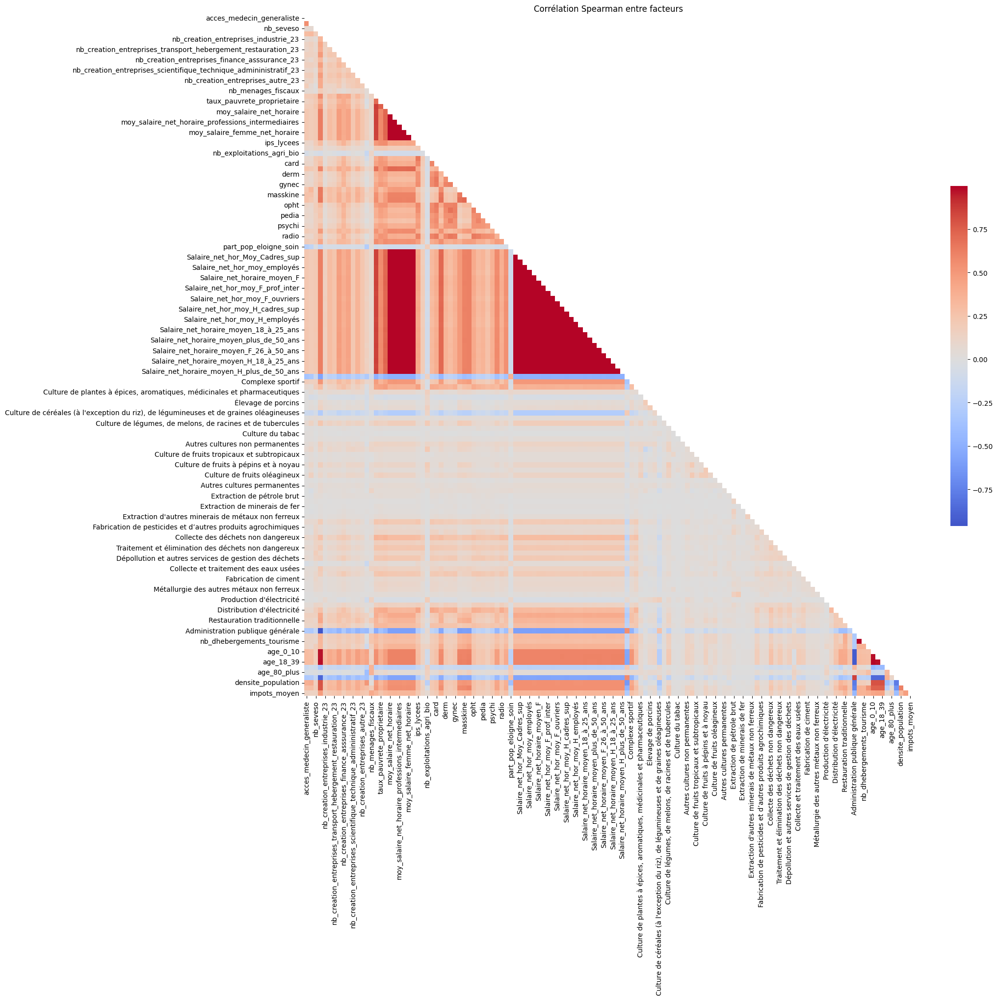

In [8]:
# Suppression des colonnes non numériques
factors_corr = factors.drop(columns=['codgeo', 'libgeo', 'canton'])

# corrélation de Spearman au niveau communal
correlation_matrix = factors_corr.corr(method='spearman')

# Création d'un masque pour cacher la moitié supérieure + diagonale
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Affichage
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélation Spearman entre facteurs')
plt.show()


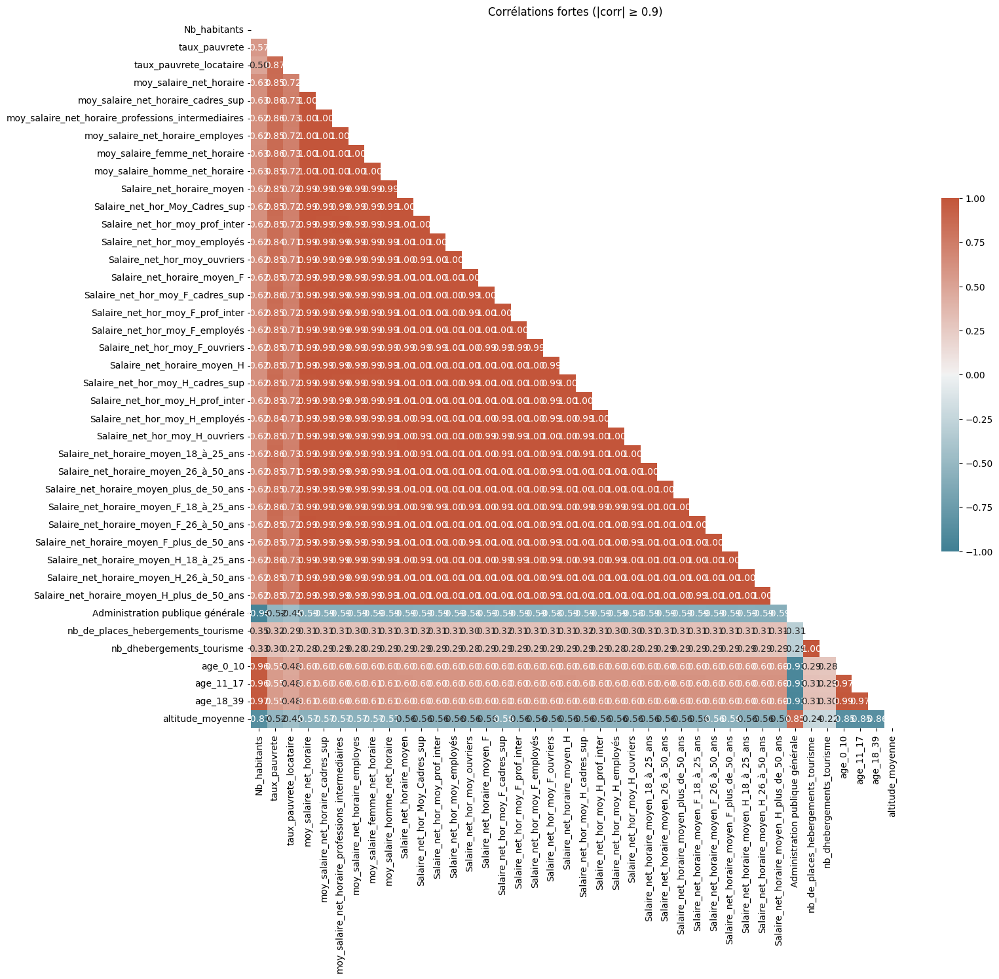

Colonnes impliquées dans des corrélations fortes (|corr| ≥ 0.85 et < 1.0) :
Nb_habitants
taux_pauvrete
taux_pauvrete_locataire
moy_salaire_net_horaire
moy_salaire_net_horaire_cadres_sup
moy_salaire_net_horaire_professions_intermediaires
moy_salaire_net_horaire_employes
moy_salaire_femme_net_horaire
moy_salaire_homme_net_horaire
Salaire_net_horaire_moyen
Salaire_net_hor_Moy_Cadres_sup
Salaire_net_hor_moy_prof_inter
Salaire_net_hor_moy_employés
Salaire_net_hor_moy_ouvriers
Salaire_net_horaire_moyen_F
Salaire_net_hor_moy_F_cadres_sup
Salaire_net_hor_moy_F_prof_inter
Salaire_net_hor_moy_F_employés
Salaire_net_hor_moy_F_ouvriers
Salaire_net_horaire_moyen_H
Salaire_net_hor_moy_H_cadres_sup
Salaire_net_hor_moy_H_prof_inter
Salaire_net_hor_moy_H_employés
Salaire_net_hor_moy_H_ouvriers
Salaire_net_horaire_moyen_18_à_25_ans
Salaire_net_horaire_moyen_26_à_50_ans
Salaire_net_horaire_moyen_plus_de_50_ans
Salaire_net_horaire_moyen_F_18_à_25_ans
Salaire_net_horaire_moyen_F_26_à_50_ans
Salaire_net_hor

In [9]:
# Filtrage : ne garder que les variables ayant au moins une corrélation forte
high_corr = (correlation_matrix.abs() >= 0.85) & (correlation_matrix.abs() < 1.0)
cols_to_keep = high_corr.any(axis=1)
filtered_corr = correlation_matrix.loc[cols_to_keep, cols_to_keep]

# Masque pour triangle supérieur + diagonale
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

# Palette de couleurs avec contraste
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Affichage de la heatmap avec annotations
plt.figure(figsize=(16, 14))
ax = sns.heatmap(
    filtered_corr,
    mask=mask,
    cmap=cmap,
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cbar_kws={"shrink": .5}
)

# Mettre en rouge vif les cases avec corr = 1
for i in range(filtered_corr.shape[0]):
    for j in range(filtered_corr.shape[1]):
        if i > j and filtered_corr.iloc[i, j] == 1.0:
            ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True, color='red', ec='red'))

plt.title('Corrélations fortes (|corr| ≥ 0.9)')
plt.show()

# Colonnes impliquées dans au moins une corrélation forte
cols_to_keep = high_corr.any(axis=1)

# Liste des noms de colonnes sans doublons
strongly_correlated_columns = correlation_matrix.columns[cols_to_keep].tolist()

# Affichage
print("Colonnes impliquées dans des corrélations fortes (|corr| ≥ 0.85 et < 1.0) :")
for col in strongly_correlated_columns:
    print(col)



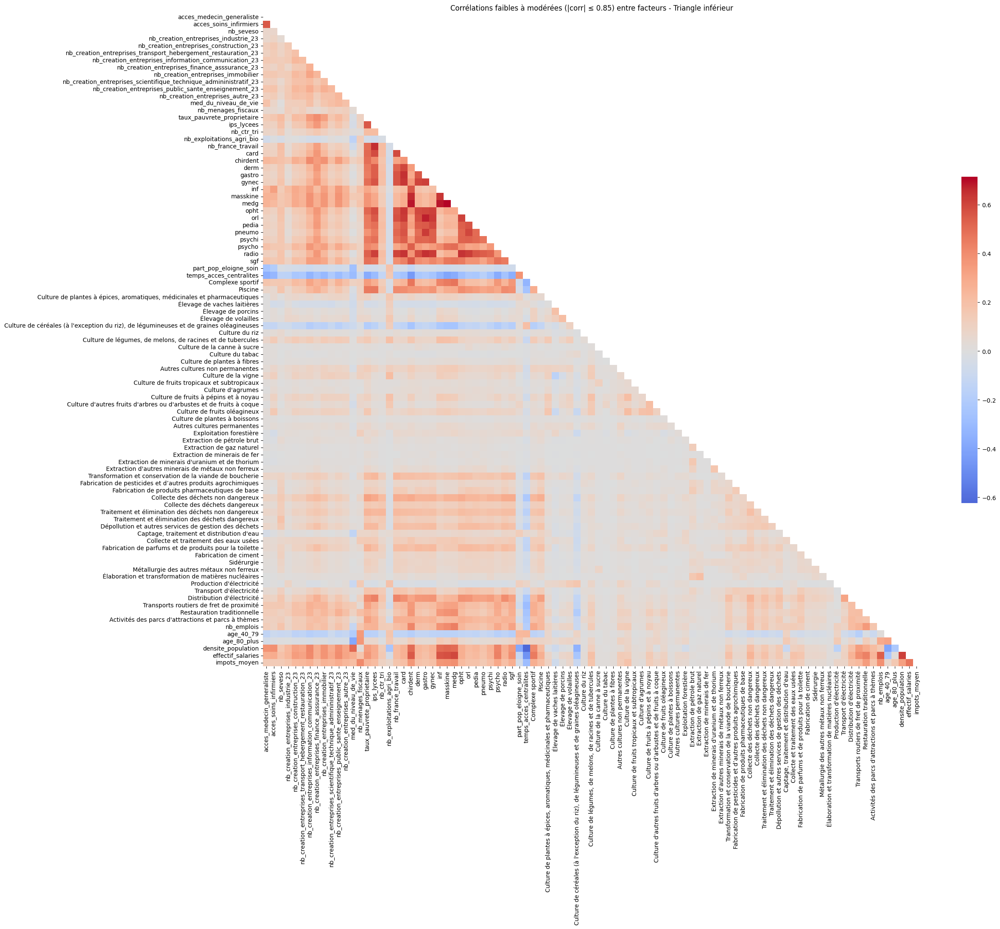

In [10]:
# Identifier les variables qui n'ont aucune corrélation forte (|corr| > 0.9)
strong_corr = (correlation_matrix.abs() > 0.85) & (correlation_matrix.abs() < 1.0)
cols_to_keep = ~strong_corr.any(axis=1)

# Sous-matrice avec uniquement les variables sans corrélations fortes
filtered_corr = correlation_matrix.loc[cols_to_keep, cols_to_keep]

# Masque pour triangle supérieur + diagonale
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

# Affichage de la heatmap
plt.figure(figsize=(25, 20))
sns.heatmap(filtered_corr, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélations faibles à modérées (|corr| ≤ 0.85) entre facteurs - Triangle inférieur')
plt.show()


In [11]:
print(f"Dimensions du df avant suppression : {factors.shape}")

# Liste des colonnes à supprimer
cols_to_drop = [
    'moy_salaire_net_horaire_cadres_sup',
    'moy_salaire_net_horaire_professions_intermediaires',
    'moy_salaire_net_horaire_employes',
    'moy_salaire_femme_net_horaire',
    'moy_salaire_homme_net_horaire',
    'Salaire_net_horaire_moyen',
    'Salaire_net_hor_Moy_Cadres_sup',
    'Salaire_net_hor_moy_prof_inter',
    'Salaire_net_hor_moy_employés',
    'Salaire_net_hor_moy_ouvriers',
    'Salaire_net_horaire_moyen_F',
    'Salaire_net_hor_moy_F_cadres_sup',
    'Salaire_net_hor_moy_F_prof_inter',
    'Salaire_net_hor_moy_F_employés',
    'Salaire_net_hor_moy_F_ouvriers',
    'Salaire_net_horaire_moyen_H',
    'Salaire_net_hor_moy_H_cadres_sup',
    'Salaire_net_hor_moy_H_prof_inter',
    'Salaire_net_hor_moy_H_employés',
    'Salaire_net_hor_moy_H_ouvriers',
    'Salaire_net_horaire_moyen_18_à_25_ans',
    'Salaire_net_horaire_moyen_26_à_50_ans',
    'Salaire_net_horaire_moyen_plus_de_50_ans',
    'Salaire_net_horaire_moyen_F_18_à_25_ans',
    'Salaire_net_horaire_moyen_F_26_à_50_ans',
    'Salaire_net_horaire_moyen_F_plus_de_50_ans',
    'Salaire_net_horaire_moyen_H_18_à_25_ans',
    'Salaire_net_horaire_moyen_H_26_à_50_ans',
    'Salaire_net_horaire_moyen_H_plus_de_50_ans',
    'taux_pauvrete_locataire',
    'taux_pauvrete_proprietaire',
    'nb_de_places_hebergements_tourisme'
]

# Suppression des colonnes du df sauf 1
factors = factors.drop(columns=cols_to_drop)

# Vérification
print(f"Dimensions du df après suppression des colonnes trop correlées: {factors.shape}")


Dimensions du df avant suppression : (35031, 134)
Dimensions du df après suppression des colonnes trop correlées: (35031, 102)


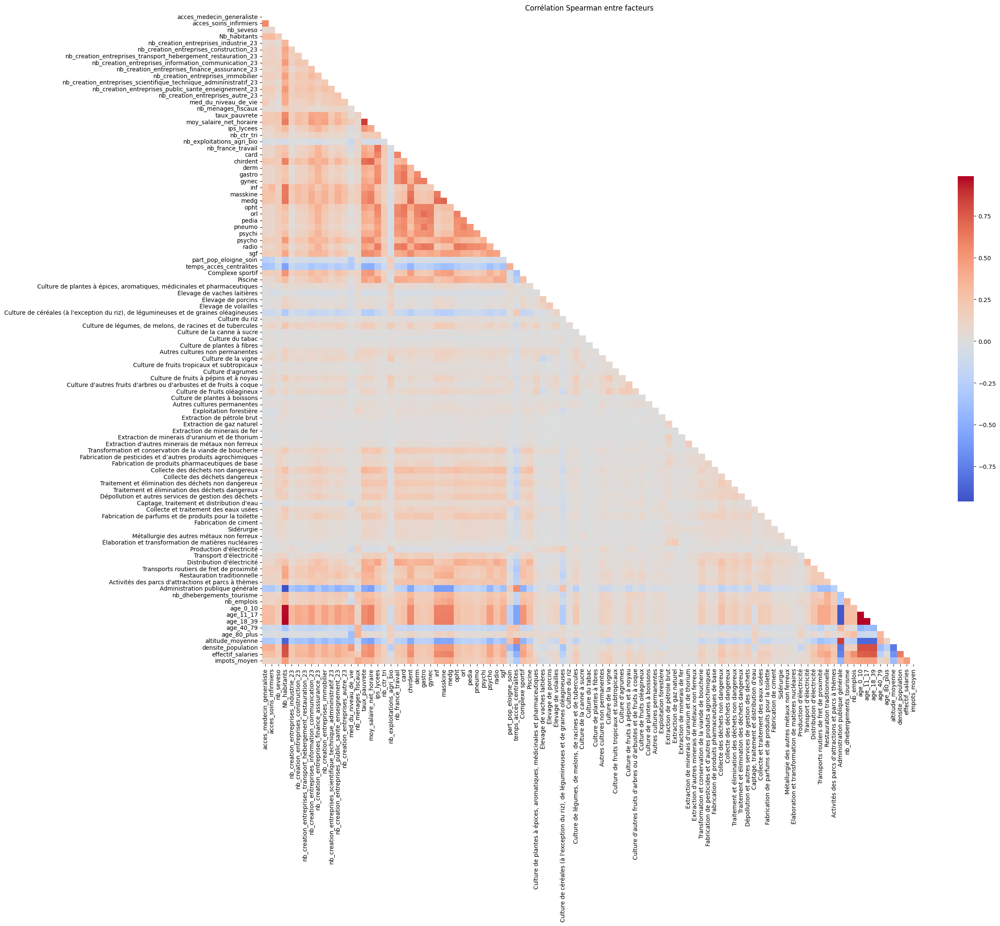

In [12]:
# Suppression des colonnes non numériques
factors_corr = factors.drop(columns=['codgeo', 'libgeo', 'canton'])

# Calcul de la corrélation de Spearman
correlation_matrix = factors_corr.corr(method='spearman')

# Création d'un masque pour cacher la moitié supérieure + diagonale
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Affichage de la heatmap triangulaire inférieure sans annotations
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélation Spearman entre facteurs')
plt.show()


In [13]:
# FAIRE DES CORRELATIONS AU NIVEAU CANTONAL

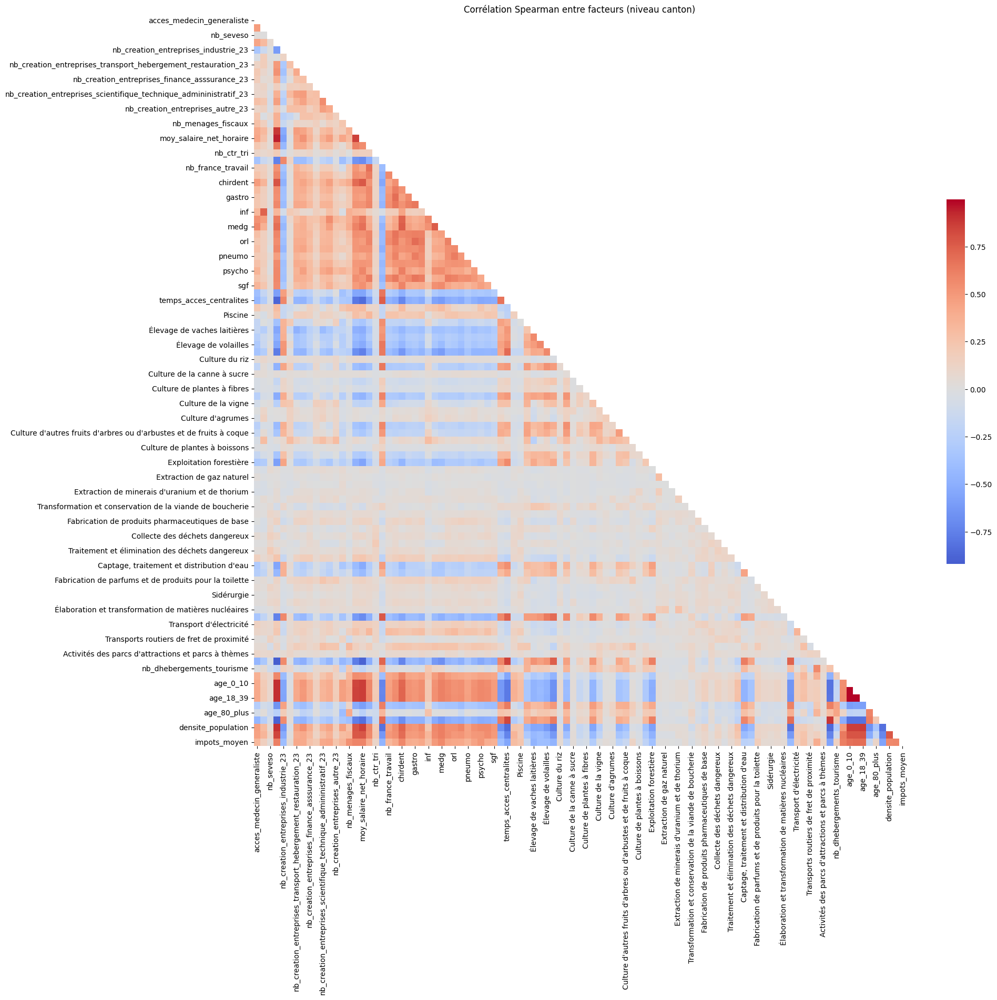

In [14]:
factors_canton = factors.drop(columns=['codgeo', 'libgeo'])  

# Moyenne par canton
factors_canton_grouped = factors_canton.groupby('canton').mean()

# Calcul de la corrélation de Spearman entre les moyennes cantonales
correlation_matrix_canton = factors_canton_grouped.corr(method='spearman')

# Création d'un masque pour cacher la moitié supérieure + diagonale
mask = np.triu(np.ones_like(correlation_matrix_canton, dtype=bool))

# Affichage de la heatmap triangulaire inférieure
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix_canton, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélation Spearman entre facteurs (niveau canton)')
plt.show()


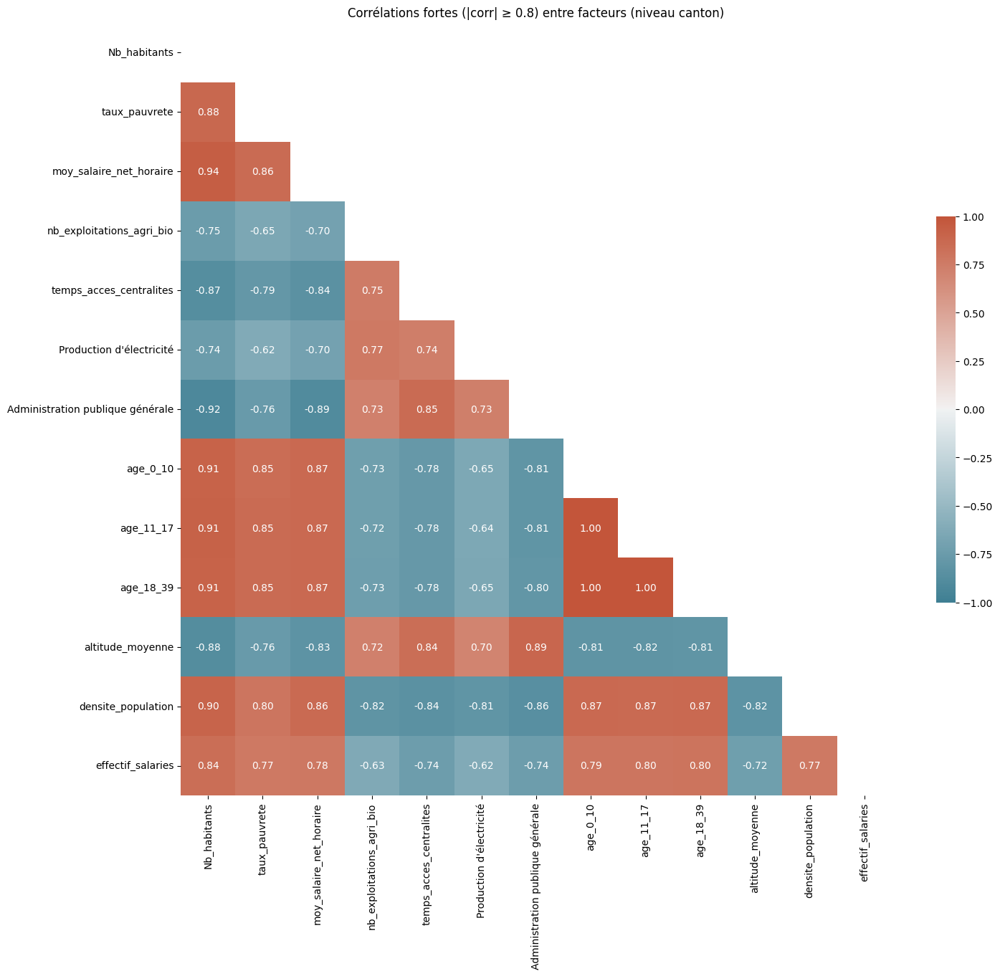

Colonnes impliquées dans des corrélations fortes (|corr| ≥ 0.8 et < 1.0) :
Nb_habitants
taux_pauvrete
moy_salaire_net_horaire
nb_exploitations_agri_bio
temps_acces_centralites
Production d'électricité
Administration publique générale
age_0_10
age_11_17
age_18_39
altitude_moyenne
densite_population
effectif_salaries


In [15]:
# Étape 1 : Filtrage des corrélations fortes au niveau canton
high_corr = (correlation_matrix_canton.abs() >= 0.8) & (correlation_matrix_canton.abs() < 1.0)
cols_to_keep = high_corr.any(axis=1)
filtered_corr = correlation_matrix_canton.loc[cols_to_keep, cols_to_keep]

# Étape 2 : Masque pour triangle supérieur + diagonale
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

# Étape 3 : Palette de couleurs avec contraste
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Étape 4 : Affichage de la heatmap avec annotations
plt.figure(figsize=(16, 14))
ax = sns.heatmap(
    filtered_corr,
    mask=mask,
    cmap=cmap,
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cbar_kws={"shrink": .5}
)

# Étape 5 : Mise en évidence en rouge vif des corrélations parfaites (= 1)
for i in range(filtered_corr.shape[0]):
    for j in range(filtered_corr.shape[1]):
        if i > j and filtered_corr.iloc[i, j] == 1.0:
            ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True, color='red', ec='red'))

plt.title('Corrélations fortes (|corr| ≥ 0.8) entre facteurs (niveau canton)')
plt.show()

# Étape 6 : Affichage des variables impliquées dans au moins une corrélation forte
strongly_correlated_columns = filtered_corr.columns.tolist()

print("Colonnes impliquées dans des corrélations fortes (|corr| ≥ 0.8 et < 1.0) :")
for col in strongly_correlated_columns:
    print(col)


In [16]:
print(f"Dimensions du df avant suppression : {factors.shape}")

# Liste des colonnes à supprimer
cols_to_drop = [
    'Nb_habitants',
    'Administration publique générale',
    'altitude_moyenne'
    
]

# Suppression des colonnes du df sauf 1
factors = factors.drop(columns=cols_to_drop)

# Vérification
print(f"Dimensions du df après suppression des colonnes trop correlées: {factors.shape}")


Dimensions du df avant suppression : (35031, 102)
Dimensions du df après suppression des colonnes trop correlées: (35031, 99)


In [17]:
factors.to_csv("tables/factors_for_visualization_reduit.csv", index=False)

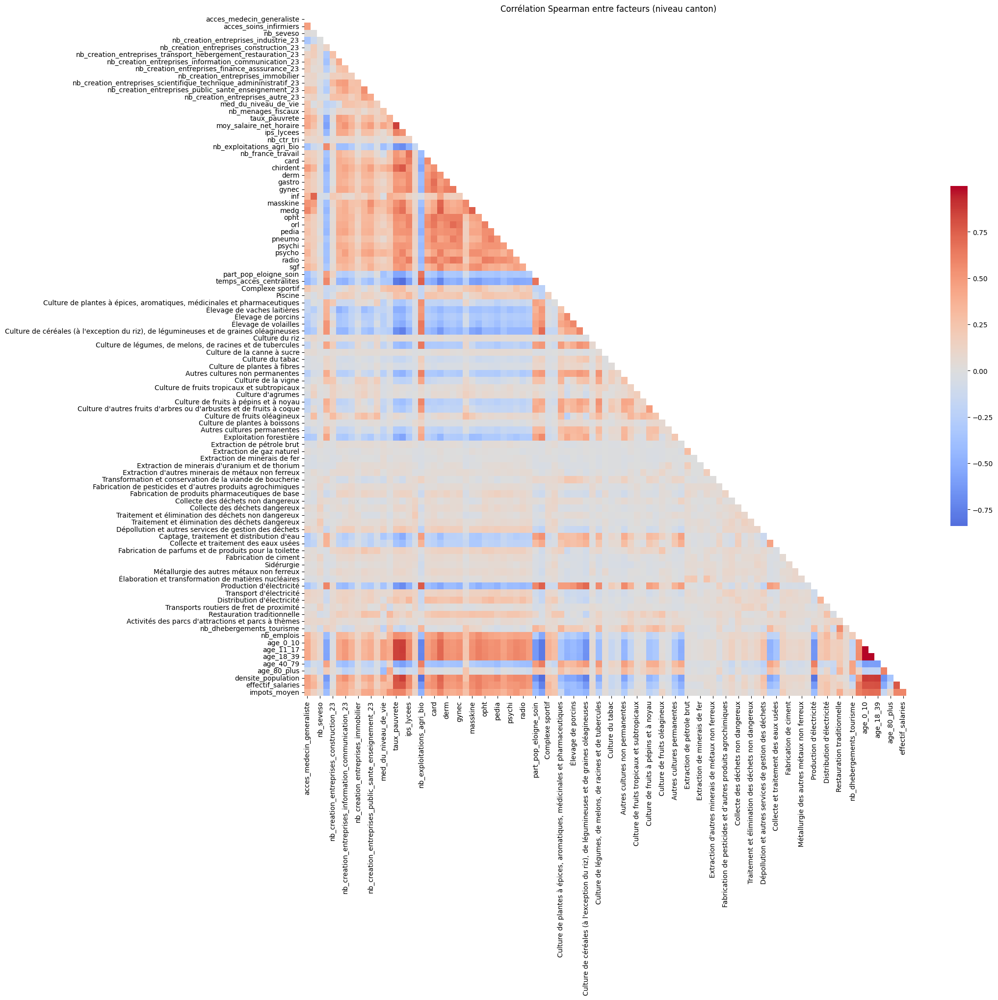

In [18]:
factors_canton = factors.drop(columns=['codgeo', 'libgeo'])  

# Moyenne par canton
factors_canton_grouped = factors_canton.groupby('canton').mean()

# Calcul de la corrélation de Spearman entre les moyennes cantonales
correlation_matrix_canton = factors_canton_grouped.corr(method='spearman')

# Création d'un masque pour cacher la moitié supérieure + diagonale
mask = np.triu(np.ones_like(correlation_matrix_canton, dtype=bool))

# Affichage de la heatmap triangulaire inférieure
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix_canton, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélation Spearman entre facteurs (niveau canton)')
plt.show()


In [19]:
factors = pd.read_csv('tables/factors_for_visualization_reduit.csv')

/tmp/ipykernel_1037/2366870316.py:1: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  factors = pd.read_csv('tables/factors_for_visualization_reduit.csv')


In [20]:
# ACP sur commune
# le principe : 
#Réduire le nombre de variables tout en conservant un maximum d’information.
#Identifier les axes principaux de variation dans les données.
#Visualiser des données complexes dans un espace à 2 ou 3 dimensions.

In [21]:
# Nettoyage
factors_numeric = factors.drop(columns=['canton', 'codgeo', 'libgeo'], errors='ignore')
factors_numeric = factors_numeric.select_dtypes(include=[np.number])
factors_numeric.replace([np.inf, -np.inf], np.nan, inplace=True)
factors_numeric.fillna(0, inplace=True)

# Normalisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(factors_numeric)


In [22]:
# PCA complète
pca = PCA()
pca.fit(X_scaled)

# Nombre de composantes pour n%
n = 0.90
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_80 = np.argmax(cumulative_variance >= n) + 1
print(f"Nombre de composantes nécessaires pour atteindre 90% de la variance : {n_components_80}")


Nombre de composantes nécessaires pour atteindre 90% de la variance : 75


In [23]:
# les données sont très riches et multidimensionnelles.
# Il n’y a pas de structure dominante facilement compressible en quelques dimensions.
# on peut réduire ton jeu de données à 37 dimensions (au lieu de toutes les colonnes d’origine) sans perdre plus de 20 % d’information.

In [24]:
# PCA à n composantes
n_components = 76
pca_37 = PCA(n_components)
X_pca_37 = pca_37.fit_transform(X_scaled)

# DataFrame réduit
columns_pca = [f'PC{i+1}' for i in range(n_components)]
factors_reduit = pd.DataFrame(X_pca_37, columns=columns_pca)

factors_reduit.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76
0,-0.218511,-0.792146,-0.752034,0.539562,0.571476,-0.241395,-0.224072,0.535275,-0.401835,-0.550089,...,0.156855,0.476128,-0.699786,0.367468,-0.158436,0.669501,0.140699,0.043506,-0.021393,-0.325016
1,-0.133968,-0.258185,-0.284768,0.203265,-0.086095,-0.575518,-0.340024,0.463528,-0.816430,-1.031456,...,-0.328708,0.750915,-1.208062,0.451555,-0.083671,-0.439321,-0.525283,-0.237397,-0.088412,0.043571
2,9.161858,1.696395,4.107460,2.922677,-2.396393,-0.256057,1.380069,1.346874,1.299332,-1.310799,...,0.541620,1.559979,0.369906,0.727285,0.472805,-0.011365,-0.115941,1.418140,-0.148002,0.893292
3,0.835017,-1.284549,-0.151898,-0.171326,-0.055124,0.220202,-0.300947,-0.512655,-0.914755,0.563360,...,0.339141,0.516469,0.050505,0.203849,0.286251,0.594393,0.265356,0.574377,-0.090836,-0.149368
4,-1.563411,0.401176,-0.289451,0.596048,0.350848,-0.703548,-0.083007,-0.592323,-0.586111,-1.781018,...,0.185457,0.135130,-0.442103,0.373630,-0.615438,-0.282208,-0.507987,0.118310,-0.045003,-0.437321


In [25]:
len(factors_reduit)

35031

In [26]:
# Ajouter les colonnes d'identifiants au DataFrame réduit
factors_reduit['codgeo'] = factors.loc[factors_numeric.index, 'codgeo'].values
factors_reduit['canton'] = factors.loc[factors_numeric.index, 'canton'].values
factors_reduit['libgeo'] = factors.loc[factors_numeric.index, 'libgeo'].values

factors_reduit.to_csv("tables/factors_reduit.csv", index = False)

In [27]:

# Composantes principales
components_df = pd.DataFrame(
    pca_37.components_,
    columns=factors_numeric.columns,
    index=[f'PC{i+1}' for i in range(n_components)]
)

# Top 12 variables par composante
top_variables_by_pc = {}
for pc in components_df.index:
    top_vars = components_df.loc[pc].abs().sort_values(ascending=False).head(12).index.tolist()
    top_variables_by_pc[pc] = top_vars

# Tableau lisible avec PC en colonnes
top_variables_table = pd.DataFrame.from_dict(top_variables_by_pc, orient='index').T
top_variables_table.head(12)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76
0,taux_pauvrete,age_18_39,pneumo,pneumo,med_du_niveau_de_vie,Transport d'électricité,nb_dhebergements_tourisme,nb_exploitations_agri_bio,"Culture de céréales (à l'exception du riz), de...",acces_medecin_generaliste,...,"Culture de plantes à épices, aromatiques, médi...",nb_france_travail,Culture de fruits oléagineux,Production d'électricité,Élevage de vaches laitières,Élevage de porcins,masskine,gynec,densite_population,"Culture de céréales (à l'exception du riz), de..."
1,moy_salaire_net_horaire,age_0_10,age_18_39,Restauration traditionnelle,nb_menages_fiscaux,Distribution d'électricité,nb_emplois,Culture de fruits à pépins et à noyau,Distribution d'électricité,acces_soins_infirmiers,...,Fabrication de parfums et de produits pour la ...,Élevage de volailles,Culture d'agrumes,"Culture de plantes à épices, aromatiques, médi...",Culture de fruits oléagineux,Élevage de volailles,inf,pedia,effectif_salaries,gynec
2,ips_lycees,age_11_17,age_0_10,nb_dhebergements_tourisme,nb_dhebergements_tourisme,Élevage de volailles,Restauration traditionnelle,Élevage de vaches laitières,Transport d'électricité,nb_menages_fiscaux,...,age_80_plus,Élevage de porcins,Exploitation forestière,Élevage de volailles,Culture de fruits à pépins et à noyau,part_pop_eloigne_soin,part_pop_eloigne_soin,chirdent,Extraction de minerais d'uranium et de thorium,Production d'électricité
3,age_11_17,med_du_niveau_de_vie,opht,gastro,Restauration traditionnelle,Production d'électricité,inf,medg,"Captage, traitement et distribution d'eau",med_du_niveau_de_vie,...,part_pop_eloigne_soin,Fabrication de parfums et de produits pour la ...,Élevage de vaches laitières,Traitement et élimination des déchets non dang...,Culture d'autres fruits d'arbres ou d'arbustes...,masskine,impots_moyen,orl,chirdent,impots_moyen
4,age_0_10,nb_menages_fiscaux,age_11_17,radio,taux_pauvrete,"Culture de céréales (à l'exception du riz), de...",nb_menages_fiscaux,"Culture de plantes à épices, aromatiques, médi...",age_80_plus,part_pop_eloigne_soin,...,pedia,Traitement et élimination des déchets non dang...,nb_creation_entreprises_scientifique_technique...,Culture de fruits à pépins et à noyau,Élevage de porcins,densite_population,"Culture de plantes à épices, aromatiques, médi...",effectif_salaries,"Culture de céréales (à l'exception du riz), de...",inf
5,temps_acces_centralites,part_pop_eloigne_soin,gastro,opht,impots_moyen,"Captage, traitement et distribution d'eau",age_40_79,nb_creation_entreprises_scientifique_technique...,Production d'électricité,"Culture de céréales (à l'exception du riz), de...",...,nb_creation_entreprises_public_sante_enseignem...,nb_creation_entreprises_scientifique_technique...,Autres cultures non permanentes,age_40_79,Traitement et élimination des déchets non dang...,inf,acces_medecin_generaliste,impots_moyen,part_pop_eloigne_soin,nb_exploitations_agri_bio
6,densite_population,nb_exploitations_agri_bio,radio,card,moy_salaire_net_horaire,part_pop_eloigne_soin,nb_exploitations_agri_bio,inf,Culture de fruits oléagineux,Culture d'autres fruits d'arbres ou d'arbustes...,...,"Culture de légumes, de melons, de racines et d...",Exploitation forestière,age_80_plus,Fabrication de parfums et de produits pour la ...,Culture d'agrumes,Exploitation forestière,Production d'électricité,age_40_79,masskine,masskine
7,age_18_39,"Captage, traitement et distribution d'eau",card,nb_emplois,age_18_39,Restauration traditionnelle,nb_france_travail,Culture de la vigne,nb_exploitations_agri_bio,ips_lycees,...,Culture de fruits à pépins et à noyau,moy_salaire_net_horaire,part_pop_eloigne_soin,age_80_plus,"Culture de plantes à épices, aromatiques, médi...","Culture de plantes à épices, aromatiques, médi...",Culture d'autres fruits d'arbres ou d'arbustes...,nb_emplois,moy_salaire_net_horaire,pedia
8,chirdent,effectif_salaries,medg,impots_moyen,ips_lycees,nb_menages_fiscaux,Culture de fruits à pépins et à n

In [28]:
top_variables_table.to_csv("tables/PCA_explications_colonnes.csv", index=False)

In [29]:
# Vérifier si toutes les colonnes sont représentées dans au moins une composante
colonnes_originales = set(factors_numeric.columns)

# Ensemble des variables présentes dans les top 50 de chaque composante
variables_utilisees = set()
for top_vars in top_variables_by_pc.values():
    variables_utilisees.update(top_vars)

# Colonnes absentes
colonnes_non_representées = colonnes_originales - variables_utilisees

# Résultat
if not colonnes_non_representées:
    print("✅ Toutes les colonnes apparaissent au moins une fois dans les 12 variables les plus influentes.")
else:
    print("❌ Les colonnes suivantes ne sont présentes dans aucune des 44 composantes principales (top 12) :")
    print(sorted(colonnes_non_representées))


✅ Toutes les colonnes apparaissent au moins une fois dans les 12 variables les plus influentes.


In [30]:
# Clustering
# le principe : le K

In [31]:
factors_reduit = pd.read_csv('tables/factors_reduit.csv')

/tmp/ipykernel_1037/2729460947.py:1: DtypeWarning: Columns (76,77) have mixed types. Specify dtype option on import or set low_memory=False.
  factors_reduit = pd.read_csv('tables/factors_reduit.csv')


In [32]:
# Correction codgeo et canton
factors_reduit['codgeo'] = factors_reduit['codgeo'].astype(str).str.replace(r'\.0$', '', regex=True)
factors_reduit['canton'] = factors_reduit['canton'].astype(str).str.replace(r'\.0$', '', regex=True)

# Ajout d'un zéro devant les codes à 3 chiffres
factors_reduit['canton'] = factors_reduit['canton'].apply(lambda x: x.zfill(4) if len(x) == 3 else x)
factors_reduit['codgeo'] = factors_reduit['codgeo'].apply(lambda x: x.zfill(5) if len(x) == 4 else x)

Le nombre optimal de clusters est : 4


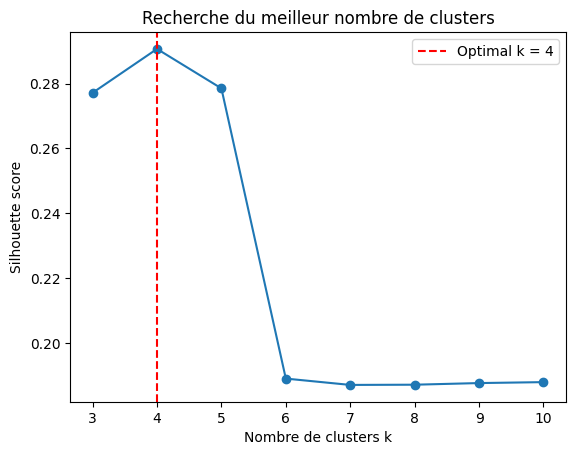

In [33]:
X_cluster = factors_reduit[[f'PC{i+1}' for i in range(44)]]
sil_scores = []
K_range = range(3, 11)

# Calcul des scores de silhouette pour chaque k
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_cluster)
    score = silhouette_score(X_cluster, labels)
    sil_scores.append(score)

# Trouver le k optimal
optimal_k = K_range[sil_scores.index(max(sil_scores))]
print(f"Le nombre optimal de clusters est : {optimal_k}")

# Affichage du graphique
plt.plot(K_range, sil_scores, marker='o')
plt.axvline(x=optimal_k, color='r', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.xlabel('Nombre de clusters k')
plt.ylabel('Silhouette score')
plt.title('Recherche du meilleur nombre de clusters')
plt.legend()
plt.show()


In [34]:
# Sélection des 44 composantes principales
X_cluster = factors_reduit[[f'PC{i+1}' for i in range(n_components)]]

# Définir le nombre de clusters (à ajuster selon ton besoin)
n_clusters = optimal_k

# Appliquer K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
factors_reduit['Cluster'] = kmeans.fit_predict(X_cluster)

factors_reduit.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC71,PC72,PC73,PC74,PC75,PC76,codgeo,canton,libgeo,Cluster
0,-0.218511,-0.792146,-0.752034,0.539562,0.571476,-0.241395,-0.224072,0.535275,-0.401835,-0.550089,...,-0.158436,0.669501,0.140699,0.043506,-0.021393,-0.325016,01001,0108,L'Abergement-Clémenciat,0
1,-0.133968,-0.258185,-0.284768,0.203265,-0.086095,-0.575518,-0.340024,0.463528,-0.816430,-1.031456,...,-0.083671,-0.439321,-0.525283,-0.237397,-0.088412,0.043571,01002,0101,L'Abergement-de-Varey,0
2,9.161858,1.696395,4.107460,2.922677,-2.396393,-0.256057,1.380069,1.346874,1.299332,-1.310799,...,0.472805,-0.011365,-0.115941,1.418140,-0.148002,0.893292,01004,0101,Ambérieu-en-Bugey,3
3,0.835017,-1.284549,-0.151898,-0.171326,-0.055124,0.220202,-0.300947,-0.512655,-0.914755,0.563360,...,0.286251,0.594393,0.265356,0.574377,-0.090836,-0.149368,01005,0122,Ambérieux-en-Dombes,0
4,-1.563411,0.401176,-0.289451,0.596048,0.350848,-0.703548,-0.083007,-0.592323,-0.586111,-1.781018,...,-0.615438,-0.282208,-0.507987,0.118310,-0.045003,-0.437321,01006,0104,Ambléon,0


In [35]:
# Score KMeans

labels_kmeans = factors_reduit['Cluster']
score_kmeans = silhouette_score(X_cluster, labels_kmeans)
print(f"Silhouette score KMeans : {score_kmeans:.3f}")

Silhouette score KMeans : 0.214


In [36]:
# Score DBSCAN

# Recherche du meilleur eps pour DBSCAN
best_score = -1
best_eps = None
best_labels = None

for eps in [1, 2, 3, 4, 5, 6, 8, 10]:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(X_cluster)
    mask = labels != -1
    n_clusters = len(set(labels[mask]))
    
    if n_clusters > 1:
        score = silhouette_score(X_cluster[mask], labels[mask])
        print(f"eps={eps}, Silhouette Score={score:.3f}")
        if score > best_score:
            best_score = score
            best_eps = eps
            best_labels = labels

# Appliquer le meilleur DBSCAN trouvé
factors_reduit['Cluster_DBSCAN'] = best_labels
score_dbscan = best_score

print(f"\n✅ Meilleur eps DBSCAN : {best_eps} avec Silhouette Score = {score_dbscan:.3f}")
            

eps=1, Silhouette Score=0.002
eps=2, Silhouette Score=-0.067
eps=3, Silhouette Score=0.163
eps=4, Silhouette Score=0.224
eps=5, Silhouette Score=0.465
eps=6, Silhouette Score=0.517
eps=8, Silhouette Score=0.642
eps=10, Silhouette Score=0.805

✅ Meilleur eps DBSCAN : 10 avec Silhouette Score = 0.805


In [37]:

# Appliquer Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=optimal_k)  # Utilise k optimal trouvé avant
agglo_labels = agglo.fit_predict(X_cluster)

# Ajouter au DataFrame
factors_reduit['Cluster_AGGLO'] = agglo_labels

# Évaluer avec silhouette score
score_agglo = silhouette_score(X_cluster, agglo_labels)
print(f"Silhouette score Agglomerative : {score_agglo:.3f}")


Silhouette score Agglomerative : 0.123


In [38]:
scores = {
    "KMeans": score_kmeans,
    "DBSCAN": score_dbscan if 'score_dbscan' in locals() else None,
    "Agglomerative": score_agglo
}

for method, score in scores.items():
    if score is not None:
        print(f"{method:15} : Silhouette score = {score:.3f}")
    else:
        print(f"{method:15} : Silhouette score = Non applicable (pas assez de clusters)")


KMeans          : Silhouette score = 0.214
DBSCAN          : Silhouette score = 0.805
Agglomerative   : Silhouette score = 0.123


In [39]:
# Le DBSCAN semble être le plus précis

In [40]:
#TSNE et UMAP visu et comparaison des 3 algo de clustering

# t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(X_cluster)
factors_reduit['TSNE1'] = tsne_result[:, 0]
factors_reduit['TSNE2'] = tsne_result[:, 1]

# UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
umap_result = reducer.fit_transform(X_cluster)
factors_reduit['UMAP1'] = umap_result[:, 0]
factors_reduit['UMAP2'] = umap_result[:, 1]

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [41]:
def plot_all_clusters_on_same_fig(df, embedding_x, embedding_y, cluster_cols, titles):
    n = len(cluster_cols)
    fig, axs = plt.subplots(1, n, figsize=(6 * n, 5))

    for i, (cluster_col, title) in enumerate(zip(cluster_cols, titles)):
        ax = axs[i]
        sns.scatterplot(
            data=df, x=embedding_x, y=embedding_y,
            hue=cluster_col, palette='Set1', s=50, ax=ax, legend=True
        )
        ax.set_title(title)
        ax.set_xlabel(embedding_x)
        ax.set_ylabel(embedding_y)
        ax.legend(title="Cluster", loc='best', fontsize=9)

    plt.tight_layout()
    plt.show()

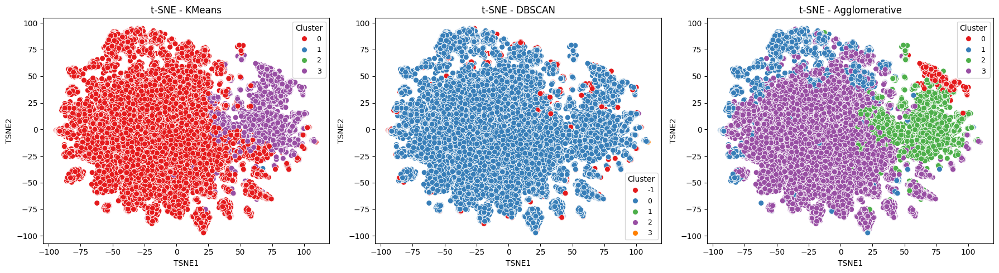

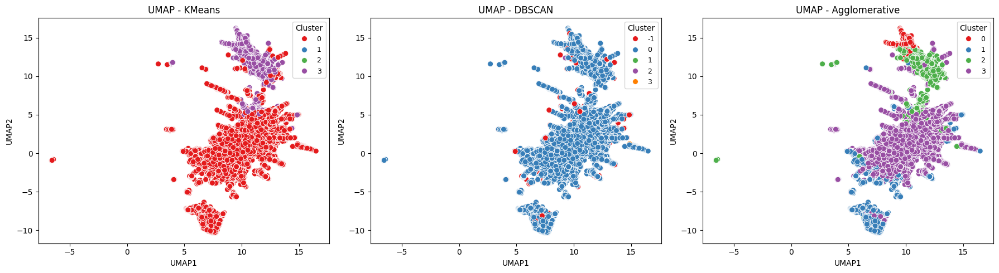

In [42]:

# Colonnes des clusters et titres
cluster_columns = ['Cluster', 'Cluster_DBSCAN', 'Cluster_AGGLO']
titles_tsne = ['t-SNE - KMeans', 't-SNE - DBSCAN', 't-SNE - Agglomerative']
titles_umap = ['UMAP - KMeans', 'UMAP - DBSCAN', 'UMAP - Agglomerative']

# Plot t-SNE
plot_all_clusters_on_same_fig(factors_reduit, 'TSNE1', 'TSNE2', cluster_columns, titles_tsne)

# Plot UMAP
plot_all_clusters_on_same_fig(factors_reduit, 'UMAP1', 'UMAP2', cluster_columns, titles_umap)


In [43]:
print(factors_reduit['Cluster_DBSCAN'].value_counts())
print(factors_reduit['Cluster'].value_counts())
print(factors_reduit['Cluster_AGGLO'].value_counts())

Cluster_DBSCAN
 0    34453
-1      560
 1        7
 3        6
 2        5
Name: count, dtype: int64
Cluster
0    29167
3     5861
1        2
2        1
Name: count, dtype: int64
Cluster_AGGLO
3    23000
2     6378
1     4748
0      905
Name: count, dtype: int64


In [44]:
# Configuration Plotly 
pio.renderers.default = 'notebook_connected'  # à adapter selon ton environnement

# réduction de dimension 
tsne_3d = TSNE(n_components=3, random_state=42)
tsne_result_3d = tsne_3d.fit_transform(X_cluster)
umap_3d = umap.UMAP(n_components=3, random_state=42)
umap_result_3d = umap_3d.fit_transform(X_cluster)

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [45]:
# nouvelles colonnes avec les 6 visualisations
factors_reduit['TSNE1'] = tsne_result_3d[:, 0]
factors_reduit['TSNE2'] = tsne_result_3d[:, 1]
factors_reduit['TSNE3'] = tsne_result_3d[:, 2]

factors_reduit['UMAP1'] = umap_result_3d[:, 0]
factors_reduit['UMAP2'] = umap_result_3d[:, 1]
factors_reduit['UMAP3'] = umap_result_3d[:, 2]

In [46]:
# fonction d'affichage
def plot_tsne_umap(df, cluster_col, algo_name):
    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        subplot_titles=(f"{algo_name} - t-SNE", f"{algo_name} - UMAP"))

    # t-SNE
    fig.add_trace(go.Scatter3d(
        x=df['TSNE1'], y=df['TSNE2'], z=df['TSNE3'],
        mode='markers',
        marker=dict(size=3, color=df[cluster_col], colorscale='Viridis', opacity=0.7),
        name='t-SNE'
    ), row=1, col=1)

    # UMAP
    fig.add_trace(go.Scatter3d(
        x=df['UMAP1'], y=df['UMAP2'], z=df['UMAP3'],
        mode='markers',
        marker=dict(size=3, color=df[cluster_col], colorscale='Viridis', opacity=0.7),
        name='UMAP'
    ), row=1, col=2)

    fig.update_layout(title_text=f"Clustering avec {algo_name}", height=600, width=1000)
    fig.show()

In [47]:
plot_tsne_umap(factors_reduit, 'Cluster', 'KMeans')
plot_tsne_umap(factors_reduit, 'Cluster_DBSCAN', 'DBSCAN')
plot_tsne_umap(factors_reduit, 'Cluster_AGGLO', 'Agglomerative')


In [48]:
# On garde le meilleur algo
# On choisit K-means

In [49]:
factors_reduit.drop(columns=['Cluster_DBSCAN', 'Cluster_AGGLO','TSNE1','TSNE2','TSNE3','UMAP1','UMAP2','UMAP3'], inplace=True)
factors_reduit.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC71,PC72,PC73,PC74,PC75,PC76,codgeo,canton,libgeo,Cluster
0,-0.218511,-0.792146,-0.752034,0.539562,0.571476,-0.241395,-0.224072,0.535275,-0.401835,-0.550089,...,-0.158436,0.669501,0.140699,0.043506,-0.021393,-0.325016,01001,0108,L'Abergement-Clémenciat,0
1,-0.133968,-0.258185,-0.284768,0.203265,-0.086095,-0.575518,-0.340024,0.463528,-0.816430,-1.031456,...,-0.083671,-0.439321,-0.525283,-0.237397,-0.088412,0.043571,01002,0101,L'Abergement-de-Varey,0
2,9.161858,1.696395,4.107460,2.922677,-2.396393,-0.256057,1.380069,1.346874,1.299332,-1.310799,...,0.472805,-0.011365,-0.115941,1.418140,-0.148002,0.893292,01004,0101,Ambérieu-en-Bugey,3
3,0.835017,-1.284549,-0.151898,-0.171326,-0.055124,0.220202,-0.300947,-0.512655,-0.914755,0.563360,...,0.286251,0.594393,0.265356,0.574377,-0.090836,-0.149368,01005,0122,Ambérieux-en-Dombes,0
4,-1.563411,0.401176,-0.289451,0.596048,0.350848,-0.703548,-0.083007,-0.592323,-0.586111,-1.781018,...,-0.615438,-0.282208,-0.507987,0.118310,-0.045003,-0.437321,01006,0104,Ambléon,0


In [50]:
factors_reduit.to_csv("tables/factors_PCA.csv", index=False)

In [51]:
# PCA au niveau cantonal

In [52]:
# restructuration de la bdd au nv cantonal

In [53]:
factors = pd.read_csv('tables/factors_for_visualization_reduit.csv')
factors = factors.drop(columns=['libgeo', 'codgeo'])
facteurs_par_canton = factors.groupby('canton').mean().reset_index()

facteurs_par_canton.head()

/tmp/ipykernel_1037/521903005.py:1: DtypeWarning:

Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.



,canton,acces_medecin_generaliste,acces_soins_infirmiers,nb_seveso,nb_creation_entreprises_industrie_23,nb_creation_entreprises_construction_23,nb_creation_entreprises_transport_hebergement_restauration_23,nb_creation_entreprises_information_communication_23,nb_creation_entreprises_finance_asssurance_23,nb_creation_entreprises_immobilier,...,nb_dhebergements_tourisme,nb_emplois,age_0_10,age_11_17,age_18_39,age_40_79,age_80_plus,densite_population,effectif_salaries,impots_moyen
0,101.0,2.055556,157.544444,0.000000,0.000754,0.000892,0.001858,0.000284,0.000007,0.000188,...,0.000154,0.171863,241.888889,153.611111,457.166667,0.484258,0.052738,154.462778,359.777778,320.968128
1,102.0,1.972222,113.977778,0.000023,0.000875,0.000877,0.001699,0.000205,0.000096,0.000156,...,0.000417,0.155840,194.611111,137.555556,322.166667,0.467735,0.049043,97.033333,135.666667,292.255061
2,103.0,1.116667,50.333333,0.000000,0.000881,0.000673,0.001835,0.000020,0.000127,0.000010,...,0.001837,0.217537,271.000000,169.583333,492.500000,0.462823,0.045595,52.926667,261.083333,188.218149
3,104.0,2.490909,136.703030,0.000000,0.000788,0.000826,0.001830,0.000149,0.000037,0.000050,...,0.000853,0.164658,92.848485,74.636364,162.212121,0.535991,0.056454,61.070909,117.454545,212.525858
4,105.0,3.500000,185.800000,0.000147,0.000734,0.000734,0.002497,0.000000,0.000000,0.000147,...,0.000588,0.709313,893.000000,644.000000,1499.000000,0.482814,0.050088,151.290000,2440.000000,493.119271


In [54]:
# Nettoyage
factors_numeric = facteurs_par_canton.drop(columns=['canton'], errors='ignore')
factors_numeric = factors_numeric.select_dtypes(include=[np.number])
factors_numeric.replace([np.inf, -np.inf], np.nan, inplace=True)
factors_numeric.fillna(0, inplace=True)

# Normalisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(factors_numeric)


In [55]:
# PCA complète
pca = PCA()
pca.fit(X_scaled)

# Nombre de composantes pour n%
n = 0.90
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_80 = np.argmax(cumulative_variance >= n) + 1
print(f"Nombre de composantes nécessaires pour atteindre 90% de la variance : {n_components_80}")


Nombre de composantes nécessaires pour atteindre 90% de la variance : 62


In [56]:
# PCA à n composantes
n_components = n_components_80
pca_37 = PCA(n_components)
X_pca_37 = pca_37.fit_transform(X_scaled)

# DataFrame réduit
columns_pca = [f'PC{i+1}' for i in range(n_components)]
factors_reduit = pd.DataFrame(X_pca_37, columns=columns_pca)

factors_reduit.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62
0,-1.933282,-0.353520,0.305755,-0.578238,-0.008210,0.709210,-0.415122,0.308568,0.179906,-0.710614,...,0.185760,0.836094,1.253550,-0.467574,2.116637,1.252735,0.696094,-0.132027,-0.749502,0.502767
1,-1.938249,-2.138539,-0.126662,0.118398,-0.098074,-0.096344,-0.228316,0.186806,0.818943,0.040562,...,-0.081113,0.591186,0.231431,0.441483,0.004629,-0.023015,0.115732,-0.425516,0.140373,-0.381908
2,-2.758108,-1.765159,0.578319,-0.404877,-0.511128,1.508356,-1.833810,0.071212,-0.182406,0.841828,...,-0.588636,-0.701197,-0.329565,-0.108834,0.676122,-0.879824,0.617085,-0.272104,0.040024,-0.728834
3,-2.766035,-0.411426,0.563935,-0.202927,0.121872,0.315425,-0.376748,-0.365378,0.632397,0.559018,...,0.893040,-0.248168,0.148300,0.257389,0.114244,0.022741,0.175064,-1.287510,0.000181,0.341386
4,1.306057,-1.653542,-1.689562,0.721803,-0.323824,1.714239,-0.652550,2.509456,-0.503309,-0.182082,...,0.557809,-0.047488,-0.242802,0.276419,0.849213,-1.275949,0.994141,0.172169,-0.276410,0.074324


In [57]:
# Ajouter les colonnes d'identifiants au DataFrame réduit
factors_reduit['canton'] = facteurs_par_canton.loc[factors_numeric.index, 'canton'].values
# Correction codgeo et canton
factors_reduit['canton'] = factors_reduit['canton'].astype(str).str.replace(r'\.0$', '', regex=True)
factors_reduit['canton'] = factors_reduit['canton'].apply(lambda x: x.zfill(4) if len(x) == 3 else x)

Le nombre optimal de clusters est : 4


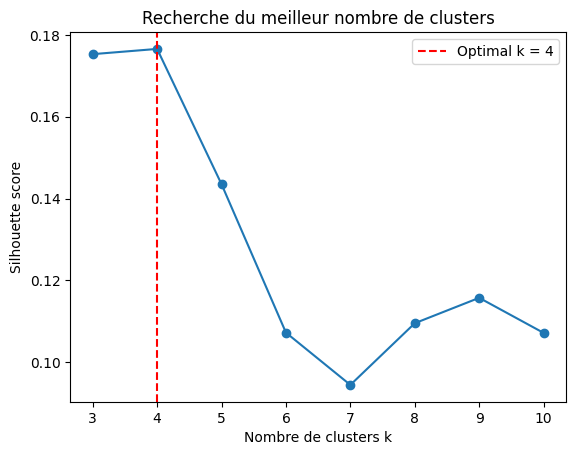

In [58]:
X_cluster = factors_reduit[[f'PC{i+1}' for i in range(44)]]
sil_scores = []
K_range = range(3, 11)

# Calcul des scores de silhouette pour chaque k
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_cluster)
    score = silhouette_score(X_cluster, labels)
    sil_scores.append(score)

# Trouver le k optimal
optimal_k = K_range[sil_scores.index(max(sil_scores))]
print(f"Le nombre optimal de clusters est : {optimal_k}")

# Affichage du graphique
plt.plot(K_range, sil_scores, marker='o')
plt.axvline(x=optimal_k, color='r', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.xlabel('Nombre de clusters k')
plt.ylabel('Silhouette score')
plt.title('Recherche du meilleur nombre de clusters')
plt.legend()
plt.show()


In [59]:
# Sélection des 44 composantes principales
X_cluster = factors_reduit[[f'PC{i+1}' for i in range(n_components)]]

# Définir le nombre de clusters (à ajuster selon ton besoin)
n_clusters = optimal_k

# Appliquer K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
factors_reduit['Cluster'] = kmeans.fit_predict(X_cluster)



In [60]:
# Score KMeans

labels_kmeans = factors_reduit['Cluster']
score_kmeans = silhouette_score(X_cluster, labels_kmeans)
print(f"Silhouette score KMeans : {score_kmeans:.3f}")

Silhouette score KMeans : 0.085


In [61]:
# Score DBSCAN

# Recherche du meilleur eps pour DBSCAN
best_score = -1
best_eps = None
best_labels = None

for eps in [1, 2, 3, 4, 5, 6, 8, 10]:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(X_cluster)
    mask = labels != -1
    n_clusters = len(set(labels[mask]))
    
    if n_clusters > 1:
        score = silhouette_score(X_cluster[mask], labels[mask])
        print(f"eps={eps}, Silhouette Score={score:.3f}")
        if score > best_score:
            best_score = score
            best_eps = eps
            best_labels = labels

# Appliquer le meilleur DBSCAN trouvé
factors_reduit['Cluster_DBSCAN'] = best_labels
score_dbscan = best_score

print(f"\n✅ Meilleur eps DBSCAN : {best_eps} avec Silhouette Score = {score_dbscan:.3f}")
            

eps=2, Silhouette Score=0.711
eps=3, Silhouette Score=0.271
eps=4, Silhouette Score=0.337
eps=5, Silhouette Score=0.309
eps=6, Silhouette Score=0.345
eps=8, Silhouette Score=0.293

✅ Meilleur eps DBSCAN : 2 avec Silhouette Score = 0.711


In [62]:

# Appliquer Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=optimal_k)  # Utilise k optimal trouvé avant
agglo_labels = agglo.fit_predict(X_cluster)

# Ajouter au DataFrame
factors_reduit['Cluster_AGGLO'] = agglo_labels

# Évaluer avec silhouette score
score_agglo = silhouette_score(X_cluster, agglo_labels)
print(f"Silhouette score Agglomerative : {score_agglo:.3f}")


Silhouette score Agglomerative : 0.107


In [63]:
scores = {
    "KMeans": score_kmeans,
    "DBSCAN": score_dbscan if 'score_dbscan' in locals() else None,
    "Agglomerative": score_agglo
}

for method, score in scores.items():
    if score is not None:
        print(f"{method:15} : Silhouette score = {score:.3f}")
    else:
        print(f"{method:15} : Silhouette score = Non applicable (pas assez de clusters)")


KMeans          : Silhouette score = 0.085
DBSCAN          : Silhouette score = 0.711
Agglomerative   : Silhouette score = 0.107


In [64]:
#TSNE et UMAP visu et comparaison des 3 algo de clustering

# t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(X_cluster)
factors_reduit['TSNE1'] = tsne_result[:, 0]
factors_reduit['TSNE2'] = tsne_result[:, 1]

# UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
umap_result = reducer.fit_transform(X_cluster)
factors_reduit['UMAP1'] = umap_result[:, 0]
factors_reduit['UMAP2'] = umap_result[:, 1]

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [65]:
def plot_all_clusters_on_same_fig(df, embedding_x, embedding_y, cluster_cols, titles):
    n = len(cluster_cols)
    fig, axs = plt.subplots(1, n, figsize=(6 * n, 5))

    for i, (cluster_col, title) in enumerate(zip(cluster_cols, titles)):
        ax = axs[i]
        sns.scatterplot(
            data=df, x=embedding_x, y=embedding_y,
            hue=cluster_col, palette='Set1', s=50, ax=ax, legend=True
        )
        ax.set_title(title)
        ax.set_xlabel(embedding_x)
        ax.set_ylabel(embedding_y)
        ax.legend(title="Cluster", loc='best', fontsize=9)

    plt.tight_layout()
    plt.show()

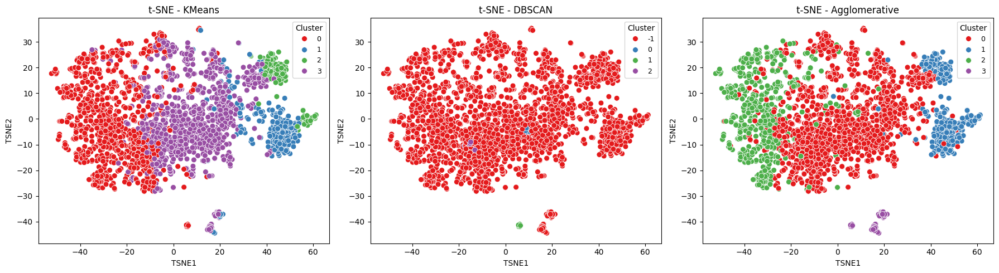

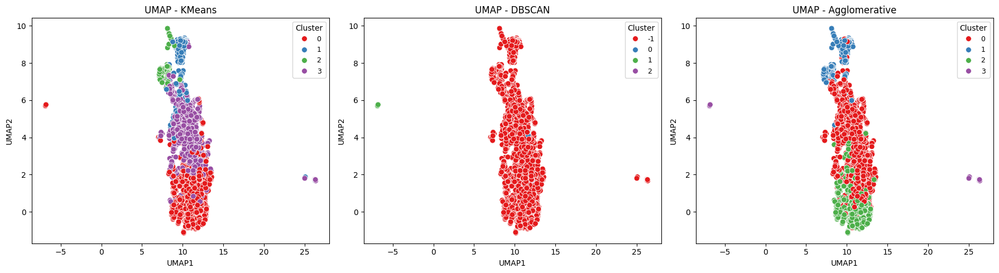

In [66]:

# Colonnes des clusters et titres
cluster_columns = ['Cluster', 'Cluster_DBSCAN', 'Cluster_AGGLO']
titles_tsne = ['t-SNE - KMeans', 't-SNE - DBSCAN', 't-SNE - Agglomerative']
titles_umap = ['UMAP - KMeans', 'UMAP - DBSCAN', 'UMAP - Agglomerative']

# Plot t-SNE
plot_all_clusters_on_same_fig(factors_reduit, 'TSNE1', 'TSNE2', cluster_columns, titles_tsne)

# Plot UMAP
plot_all_clusters_on_same_fig(factors_reduit, 'UMAP1', 'UMAP2', cluster_columns, titles_umap)


In [67]:
print(factors_reduit['Cluster_DBSCAN'].value_counts())
print(factors_reduit['Cluster'].value_counts())
print(factors_reduit['Cluster_AGGLO'].value_counts())

Cluster_DBSCAN
-1    2074
 1      12
 0       7
 2       5
Name: count, dtype: int64
Cluster
0    884
3    860
1    227
2    127
Name: count, dtype: int64
Cluster_AGGLO
0    1228
2     530
1     288
3      52
Name: count, dtype: int64


In [68]:
# Configuration Plotly 
pio.renderers.default = 'notebook_connected'  # à adapter selon ton environnement

# réduction de dimension 
tsne_3d = TSNE(n_components=3, random_state=42)
tsne_result_3d = tsne_3d.fit_transform(X_cluster)
umap_3d = umap.UMAP(n_components=3, random_state=42)
umap_result_3d = umap_3d.fit_transform(X_cluster)

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [69]:
# nouvelles colonnes avec les 6 visualisations
factors_reduit['TSNE1'] = tsne_result_3d[:, 0]
factors_reduit['TSNE2'] = tsne_result_3d[:, 1]
factors_reduit['TSNE3'] = tsne_result_3d[:, 2]

factors_reduit['UMAP1'] = umap_result_3d[:, 0]
factors_reduit['UMAP2'] = umap_result_3d[:, 1]
factors_reduit['UMAP3'] = umap_result_3d[:, 2]

In [70]:
# fonction d'affichage
def plot_tsne_umap(df, cluster_col, algo_name):
    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        subplot_titles=(f"{algo_name} - t-SNE", f"{algo_name} - UMAP"))

    # t-SNE
    fig.add_trace(go.Scatter3d(
        x=df['TSNE1'], y=df['TSNE2'], z=df['TSNE3'],
        mode='markers',
        marker=dict(size=3, color=df[cluster_col], colorscale='Viridis', opacity=0.7),
        name='t-SNE'
    ), row=1, col=1)

    # UMAP
    fig.add_trace(go.Scatter3d(
        x=df['UMAP1'], y=df['UMAP2'], z=df['UMAP3'],
        mode='markers',
        marker=dict(size=3, color=df[cluster_col], colorscale='Viridis', opacity=0.7),
        name='UMAP'
    ), row=1, col=2)

    fig.update_layout(title_text=f"Clustering avec {algo_name}", height=600, width=1000)
    fig.show()

In [71]:
plot_tsne_umap(factors_reduit, 'Cluster', 'KMeans')
plot_tsne_umap(factors_reduit, 'Cluster_DBSCAN', 'DBSCAN')
plot_tsne_umap(factors_reduit, 'Cluster_AGGLO', 'Agglomerative')


In [72]:
factors_reduit.drop(columns=['Cluster_DBSCAN', 'Cluster_AGGLO','TSNE1','TSNE2','TSNE3','UMAP1','UMAP2','UMAP3'], inplace=True)
factors_reduit.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,canton,Cluster
0,-1.933282,-0.353520,0.305755,-0.578238,-0.008210,0.709210,-0.415122,0.308568,0.179906,-0.710614,...,1.253550,-0.467574,2.116637,1.252735,0.696094,-0.132027,-0.749502,0.502767,0101,0
1,-1.938249,-2.138539,-0.126662,0.118398,-0.098074,-0.096344,-0.228316,0.186806,0.818943,0.040562,...,0.231431,0.441483,0.004629,-0.023015,0.115732,-0.425516,0.140373,-0.381908,0102,3
2,-2.758108,-1.765159,0.578319,-0.404877,-0.511128,1.508356,-1.833810,0.071212,-0.182406,0.841828,...,-0.329565,-0.108834,0.676122,-0.879824,0.617085,-0.272104,0.040024,-0.728834,0103,0
3,-2.766035,-0.411426,0.563935,-0.202927,0.121872,0.315425,-0.376748,-0.365378,0.632397,0.559018,...,0.148300,0.257389,0.114244,0.022741,0.175064,-1.287510,0.000181,0.341386,0104,0
4,1.306057,-1.653542,-1.689562,0.721803,-0.323824,1.714239,-0.652550,2.509456,-0.503309,-0.182082,...,-0.242802,0.276419,0.849213,-1.275949,0.994141,0.172169,-0.276410,0.074324,0105,3


In [73]:
factors_reduit.to_csv("tables/factors_PCA_au_canton.csv", index = False)